# Outlier Detection framework

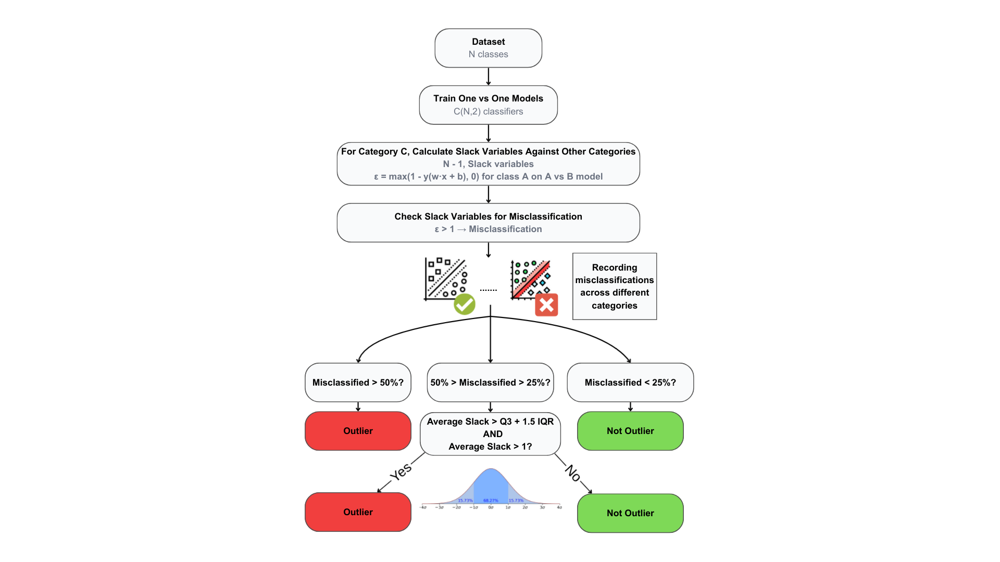

### Necessary Imports

In [1]:
import pandas as pd
import os
from google.colab import drive
import numpy as np
import random
import copy
import time
from cvxopt import matrix, solvers
!pip install pillow-heif
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import pillow_heif

pillow_heif.register_heif_opener()
drive.mount('/content/drive')
MY_DRIVE_PATH = "/content/drive/MyDrive/MLProject_2"
DATA_FOLDER = os.path.join(MY_DRIVE_PATH, 'Data google sheet')
PROCESSED_CSV_FILE = os.path.join(DATA_FOLDER, 'Processed_Fruits_Data.csv')
ONEHOT_CSV_FILE = os.path.join(DATA_FOLDER, 'One_Hot_Processed_Fruits_Data.csv')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 20.6 MB/s eta 0:00:00
Mounted at /content/drive


### Mislabeled Data Injection

For every fruit category, we are adding 10 more data from other classes. We are doing this to test our outlier detection framework.

In [2]:
df = pd.read_csv(ONEHOT_CSV_FILE, sep = ";")
random.seed(42)
np.random.seed(42)

categories = ['banana', 'tomato', 'apple', 'orange', 'tangerine']

n_inject_per_class = 10
injected_indices = []
injection_info = []

for target_category in categories:
    other_categories = [c for c in categories if c != target_category]
    other_indices = []
    for other_cat in other_categories:
        cat_mask = (df['Fruit'] == other_cat)
        other_indices.extend(df[cat_mask].index.tolist())

    # Randomly selecting 10 indices to inject to this category
    selected_indices = np.random.choice(other_indices, size=n_inject_per_class, replace=False)

    # Injecting the row
    for orig_idx in selected_indices:
        new_row = df.iloc[orig_idx].copy()
        true_label = new_row['Fruit']
        # Mislabeling
        new_row['Fruit'] = target_category

        # Append to dataframe
        new_idx = len(df)
        df = pd.concat([df, new_row.to_frame().T], ignore_index=True)

        injected_indices.append(new_idx)
        injection_info.append({
            'injected_idx': new_idx,
            'original_idx': orig_idx,
            'true_label': true_label,
            'fake_label': target_category
        })

print(f"Injected {len(injected_indices)} mislabeled samples")

Injected 50 mislabeled samples


### We only use image features since we have high accuracy on the other categories

In [3]:
df_unnormalized = df.copy()
image_cols = [column for column in df.columns if "img" in column]

# Converting image columns to float after injection
for col in image_cols:
    df[col] = pd.to_numeric(df[col], errors='coerce').astype(np.float64)

# Normalizing image histograms
for idx in range(len(df)):
    hist_values = df.loc[idx, image_cols].values.astype(np.float64)
    total = hist_values.sum()
    if total > 0:
        df.loc[idx, image_cols] = hist_values / total
    else:
        df.loc[idx, image_cols] = 0

# Normalization
epsilon = 1e-8
for column in image_cols:
    mean = df[column].mean()
    std = df[column].std()
    df[column] = (df[column] - mean) / (std + epsilon)

X = df[image_cols].astype(np.float64)
y = df["Fruit"]

print(f"\nDataset size: {len(df)} (original + {len(injected_indices)} mislabeled)")


Dataset size: 3232 (original + 50 mislabeled)


### Same implementation as 'SVM.ipynb'. We also return $w\cdot X + b$ for the data so that we calculate scores, and slack variables.

In [4]:
def train_svm(X_train, y_train, C=1):
  solvers.options['show_progress'] = False
  X = X_train.values
  y = y_train.reshape(-1, 1)
  n = X.shape[0]
  # Objective
  H = np.dot(y*X, (y*X).T) # a^T.H.a
  q = np.repeat([-1.0], n)[..., None] # (-1)^T
  # y.alpha = 0
  A = y.reshape(1, -1)
  b = 0.0
  # Inequality constraints
  g_first = -(np.eye(n)) # -alpha_i <= 0
  g_second = np.eye(n)   # alpha_i <= C
  G = np.vstack((g_first,g_second))
  # Inequality rhs
  h_first = np.zeros(n)
  h_second = C * np.ones(n)
  h = np.concatenate((h_first, h_second))
  P = matrix(H)
  q = matrix(q)
  G = matrix(G)
  h = matrix(h)
  A = matrix(A)
  b = matrix(b)
  sol = solvers.qp(P, q, G, h, A, b)
  alphas = np.array(sol["x"])
  w = np.dot((y * alphas).T, X)[0]
  S = (alphas > 1e-5).flatten()
  b = np.mean(y[S] - np.dot(X[S], w.reshape(-1,1)))
  # Accuracy calculation
  train_scores = np.dot(X, w) + b
  train_preds = np.where(train_scores >= 0, 1.0, -1.0)
  train_acc = np.mean(train_preds.flatten() == y.flatten())

  # Support vectors
  S = (alphas > 1e-5).flatten()
  all_support_vectors = X_train[S]

  is_positive_class = (y.flatten() == 1.0)
  is_negative_class = (y.flatten() == -1.0)
  positive_support_vec_mask = S & is_positive_class
  negative_support_vec_mask = S & is_negative_class

  positive_support_vectors = X_train.iloc[positive_support_vec_mask]
  negative_support_vectors = X_train.iloc[negative_support_vec_mask]

  # Finding most distant data
  positive_distances = np.abs(train_scores[is_positive_class] - 1.0)
  most_distant_positive_index = np.argmax(positive_distances)

  negative_distances = np.abs(train_scores[is_negative_class] + 1.0)
  most_distant_negative_index = np.argmax(negative_distances)

  margin_tolerance = 1e-2
  # Support vectors inside the margin
  inside_positive_mask = is_positive_class & (train_scores >= 0) & (train_scores < 1.0 - margin_tolerance)
  inside_negative_mask = is_negative_class & (train_scores < 0) & (train_scores > -1.0 + margin_tolerance)

  return {
      "w": w,
      "b": b,
      "p_support_vectors": positive_support_vectors,
      "n_support_vectors": negative_support_vectors,
      "inside_positive_margin" : X_train[inside_positive_mask],
      "inside_negative_margin" : X_train[inside_negative_mask],
      "support_vectors": all_support_vectors,
      "most_distant_positive_index": most_distant_positive_index,
      "most_distant_negative_index": most_distant_negative_index,
      "scores" : train_scores,
      "alphas" : alphas,
      "train_acc": train_acc,
      "original_indices": X_train.index.values
  }

def fit_softmargin_svm_one_vs_one(X_train, y_train, class1, class2, C=1):
    train_mask = (y_train == class1) | (y_train == class2)
    X_train_filtered = X_train[train_mask]
    y_train_filtered = y_train[train_mask]

    y_train_binary = np.where(y_train_filtered == class1, 1.0, -1.0)
    return train_svm(X_train_filtered, y_train_binary, C)

### Training Models with One vs One approach.

We are using one vs one approach here since one vs all causes class imbalance problems, but we want precise models. We are training $\binom{n}{2}$ classes where n is the class count.

If we trained A vs B, and we want to see scores of B, we just need to take A vs B model and negate its scores so that it transforms into B vs A. This is done to keep computation low.

We are choosing high C parameter (10) to give high slack to truly outlier data points

In [5]:
# Training models - One vs One
C = 10
models = {}
for i in range(len(categories)):
    category_1 = categories[i]
    if category_1 not in models:
        models[category_1] = {}
    for j in range(i+1, len(categories)):
        category_2 = categories[j]
        if category_2 not in models:
            models[category_2] = {}
        model_dict = fit_softmargin_svm_one_vs_one(
            X, y, category_1, category_2, C
        )
        models[category_1][category_2] = model_dict

### Logging accuracies to make sure our models are working

We can see from accuracy and support vectors counts that, some combinations are challenging and not linearly seperable.

For orange vs tangerine and banana vs apple (weirdly), most of the points are support vectors.



In [6]:
for i in range(len(categories)):
    category_1 = categories[i]
    for j in range(i+1, len(categories)):
        category_2 = categories[j]
        print(f"{category_1} vs {category_2}")
        total_points = np.sum((y == category_1) | (y == category_2))
        support_vector_count = len(models[category_1][category_2]["support_vectors"])
        print(f"  Accuracy: {models[category_1][category_2]['train_acc']}")
        print(f"  Support vectors: {support_vector_count}/{total_points}")

banana vs tomato
  Accuracy: 0.9363496932515337
  Support vectors: 422/1304
banana vs apple
  Accuracy: 0.7812018489984591
  Support vectors: 973/1298
banana vs orange
  Accuracy: 0.867601246105919
  Support vectors: 515/1284
banana vs tangerine
  Accuracy: 0.9196428571428571
  Support vectors: 451/1344
tomato vs apple
  Accuracy: 0.8645669291338582
  Support vectors: 594/1270
tomato vs orange
  Accuracy: 0.8853503184713376
  Support vectors: 451/1256
tomato vs tangerine
  Accuracy: 0.8389057750759878
  Support vectors: 676/1316
apple vs orange
  Accuracy: 0.8832
  Support vectors: 493/1250
apple vs tangerine
  Accuracy: 0.9091603053435114
  Support vectors: 422/1310
orange vs tangerine
  Accuracy: 0.683641975308642
  Support vectors: 994/1296


### Storing slack variables for outlier detection

On SVM, we added margin violation term $\varepsilon_n$ to convert it to soft-margin. We can think of this as slack variable in optimization problems.
$$y_n(\mathbf{w}^T \mathbf{x}_n + b) \geq 1 - \varepsilon_n$$

Knowing that ɛ is the distance from margin, we can say that if ɛ > 0 it has the chance to be an outlier. If ɛ = 1, it is on the decision boundary and if ɛ > 1 it is misclassified.

In [7]:
# Storing slacks for outlier detection
slacks_for_models = {}
for category in categories:
  if category not in slacks_for_models:
    slacks_for_models[category] = {}
  other_categories = [cat for cat in categories if cat != category]
  for other_category in other_categories:
    model_to_analyze = {}
    scores = None
    if other_category not in models[category]:
      model_to_analyze = models[other_category][category]
      scores = model_to_analyze["scores"] * -1
    else:
      model_to_analyze = models[category][other_category]
      scores = model_to_analyze["scores"]
    slacks = np.maximum(1 - scores,0)
    original_indices = model_to_analyze["original_indices"]
    slacks_of_indices = {}
    for i in range(len(slacks)):
      index = original_indices[i]
      if y[index] == category:
        slacks_of_indices[original_indices[i]] = slacks[i]
    slacks_for_models[category][other_category] = slacks_of_indices

#  Outlier Detection Framework

We currently have these conditions to classify a point as an outlier.

1.   If it is misclassified more than 50% of the time, it is definitely an outlier.
2.   If it is misclassified more than 25% of the time we look at slack variables:
    1. If Q3 and Q1 values are meaningful, slack > Q3 + 1.5 * IQR (Interquartlile Range)
    2. Else, It has to be on 5% tail of the slack distibution
3.   Also, average slack ɛ > 1.

We are doing this Q1, Q3 check since slack variables are 0 for the ones that are correctly classified and outside the margin. So distribution of slacks are skewed.

## Comment on the Strictness of the Constraints

We know that these constraints are too strict. However if we are not strict enough, we cannot detect outliers in this dataset. This is mostly cause by our models not being strong enough.

## Adapting to Different Datasets

If dataset features are seperable by SVM, we think that these constraints should be lowered.

*   Highest misclassification rate should be dropped to 25%
*   If it is between 0-25%, we should still look at interquartile range.
*   Average slack ɛ > 0 would be better. This would also give point that are still classified corretly but really close to decision boundary.

We adopted stricter parameters since most of our data points lie between the margin and nearly half of the data would get classified as an outlier.





In [8]:
# Analyzing outliers for all categories
all_category_statistics = {}
borderline_outlier_count = 0
direct_outlier_count = 0
for category_to_analyze in categories:
    print(f"Analyzing outliers for: {category_to_analyze}")
    # Get all indices for this category
    category_mask = (y == category_to_analyze)
    category_indices = X[category_mask].index.values
    point_statistics = {}

    # Reading slacks for every dataset index
    for idx in category_indices:
        misclassified_count = 0
        total_slack = 0
        slack_list = []
        misclassified_list = []
        other_categories = [cat for cat in categories if cat != category_to_analyze]
        for other_category in other_categories:
            if idx in slacks_for_models[category_to_analyze][other_category]:
                slack = slacks_for_models[category_to_analyze][other_category][idx]
                slack_list.append(slack)
                total_slack += slack
                if slack > 1:  # Misclassified
                    misclassified_count += 1
                    misclassified_list.append(other_category)

        # Statistics of this point
        num_classifiers = len(slack_list)
        point_statistics[idx] = {
            'total_slack': total_slack,
            'avg_slack': total_slack / num_classifiers if slack_list else 0,
            'max_slack': max(slack_list) if slack_list else 0,
            'misclassified_count': misclassified_count,
            'num_classifiers': num_classifiers,
            'misclassified_ratio': misclassified_count / num_classifiers if num_classifiers > 0 else 0,
            'misclassified_as': misclassified_list,
        }

    all_category_statistics[category_to_analyze] = point_statistics

    # IQR-based threshold
    all_avg_slacks = [s['avg_slack'] for s in point_statistics.values()]

    Q1 = np.percentile(all_avg_slacks, 25)
    Q3 = np.percentile(all_avg_slacks, 75)
    IQR = Q3 - Q1

    if IQR > 0.01:
        # They are not the same, so we can use it
        slack_threshold = Q3 + 1.5 * IQR
    else:
        # Use 5% instead
        slack_threshold = np.percentile(all_avg_slacks, 95)

    direct_outliers = []
    borderline_outliers = []

    for idx, s in point_statistics.items():
        misclass_ratio = s['misclassified_ratio']

        if misclass_ratio >= 0.5:
            direct_outliers.append(idx)
            direct_outlier_count += 1
        elif misclass_ratio >= 0.25:
            # We need to look at slacks
            if s['avg_slack'] > slack_threshold and s['avg_slack'] > 1:
                borderline_outliers.append(idx)
                borderline_outlier_count += 1

    outliers = direct_outliers + borderline_outliers

    print(f"  Slack threshold: {slack_threshold:.4f} (IQR method: {IQR > 0.01})")
    print(f"  Outliers detected: {len(outliers)} points")
    print(f"    - Definite (misclass >= 50%): {len(direct_outliers)}")
    print(f"    - Borderline (25-50% + high slack): {len(borderline_outliers)}")

print(f"\nTotal outliers detected: {direct_outlier_count + borderline_outlier_count}, Direct : {direct_outlier_count}, Borderline : {borderline_outlier_count}")

Analyzing outliers for: banana
  Slack threshold: 1.0351 (IQR method: True)
  Outliers detected: 77 points
    - Definite (misclass >= 50%): 67
    - Borderline (25-50% + high slack): 10
Analyzing outliers for: tomato
  Slack threshold: 1.0787 (IQR method: True)
  Outliers detected: 85 points
    - Definite (misclass >= 50%): 81
    - Borderline (25-50% + high slack): 4
Analyzing outliers for: apple
  Slack threshold: 1.2498 (IQR method: True)
  Outliers detected: 74 points
    - Definite (misclass >= 50%): 72
    - Borderline (25-50% + high slack): 2
Analyzing outliers for: orange
  Slack threshold: 1.3912 (IQR method: True)
  Outliers detected: 124 points
    - Definite (misclass >= 50%): 124
    - Borderline (25-50% + high slack): 0
Analyzing outliers for: tangerine
  Slack threshold: 1.0857 (IQR method: True)
  Outliers detected: 82 points
    - Definite (misclass >= 50%): 80
    - Borderline (25-50% + high slack): 2

Total outliers detected: 442, Direct : 424, Borderline : 18


# Analysis of General Outlier Detection

Even with these constraints, we still see 442 outliers. This is mostly cause by our features not capturing the whole information. On a better dataset we would see this number drop and see more borderline outliers.

In [9]:
# Validation by checking injected outliers
detected_count = 0
missed_count = 0
detected_list = []
missed_list = []
borderline_detected = 0
direct_detected = 0

for info in injection_info:
    idx = info['injected_idx']
    fake_label = info['fake_label']
    true_label = info['true_label']
    stats = all_category_statistics[fake_label][idx]

    # Get thresholds for this category
    cat_stats = all_category_statistics[fake_label]
    all_avg_slacks = [s['avg_slack'] for s in cat_stats.values()]
    Q1, Q3 = np.percentile(all_avg_slacks, 25), np.percentile(all_avg_slacks, 75)
    IQR = Q3 - Q1
    slack_threshold = Q3 + 1.5 * IQR if IQR > 0.01 else np.percentile(all_avg_slacks, 95)

    misclass_ratio = stats['misclassified_ratio']

    if misclass_ratio >= 0.5:
        direct_detected += 1
        is_outlier = True
    elif misclass_ratio >= 0.25:
        is_outlier = (stats['avg_slack'] > slack_threshold and stats['avg_slack'] > 1)
        if is_outlier:
            borderline_detected += 1
    else:
        is_outlier = False

    if is_outlier:
        detected_count += 1
        detected_list.append(info)
    else:
        missed_count += 1
        missed_list.append(info)

total = len(injection_info)
detection_rate = detected_count / total * 100
print(f"Detection Rate: {detected_count}/{total} ({detection_rate:.1f}%)")

print(f"\nDetection breakdown:")
print(f"  Direct: {direct_detected}")
print(f"  Borderline: {borderline_detected}")

always_misclassified = 0
three_times_misclassified = 0
for missed in missed_list:
    stats = all_category_statistics[missed['fake_label']][missed['injected_idx']]
    if stats['misclassified_ratio'] < 0.25:
        always_misclassified += 1
    elif stats['misclassified_ratio'] <= 0.5:
        three_times_misclassified += 1
print("For the unseen outliers")
print(f"Always misclassified : {always_misclassified}")
print(f"Was correctly classified once : {three_times_misclassified}")


Detection Rate: 33/50 (66.0%)

Detection breakdown:
  Direct: 33
  Borderline: 0
For the unseen outliers
Always misclassified : 5
Was correctly classified once : 12


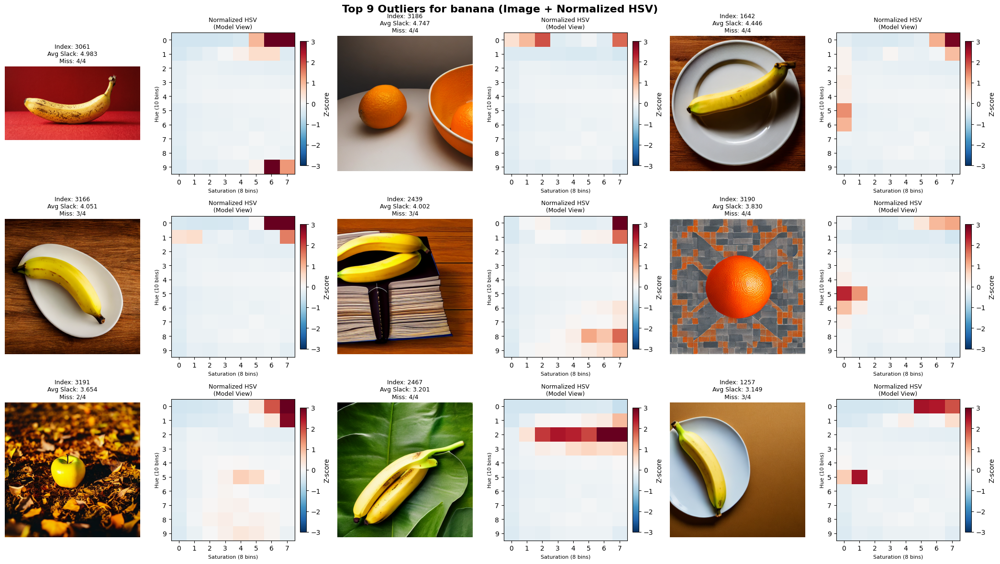

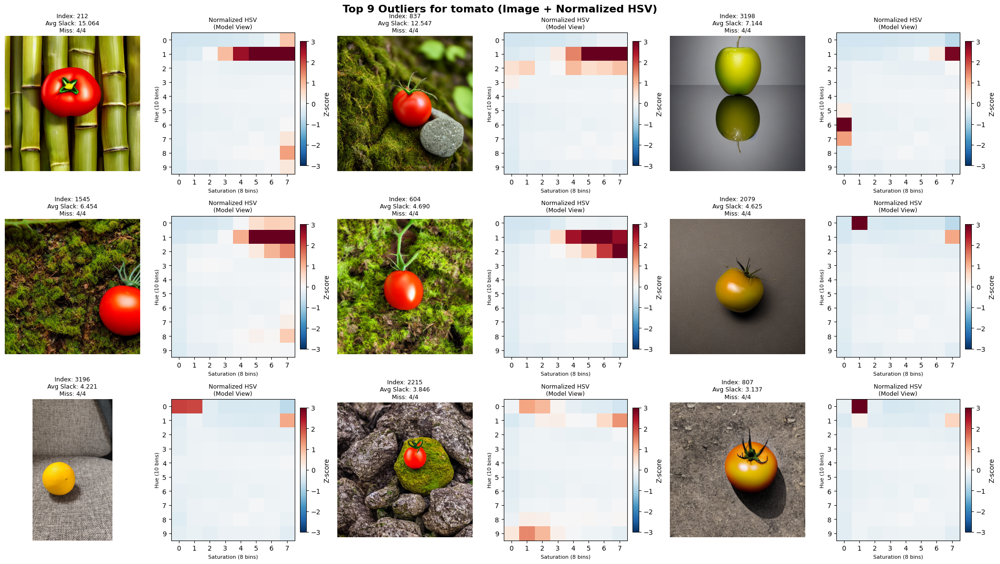

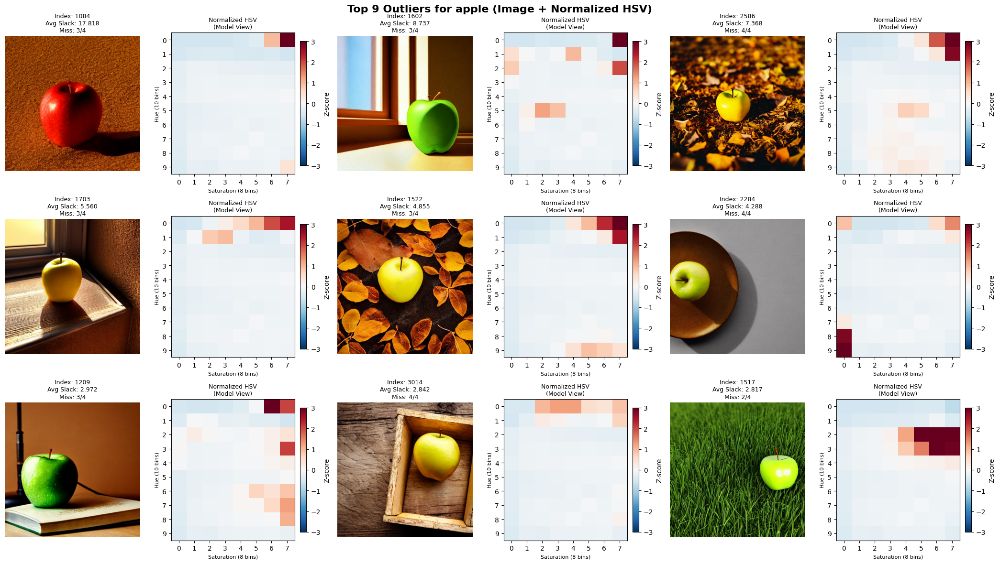

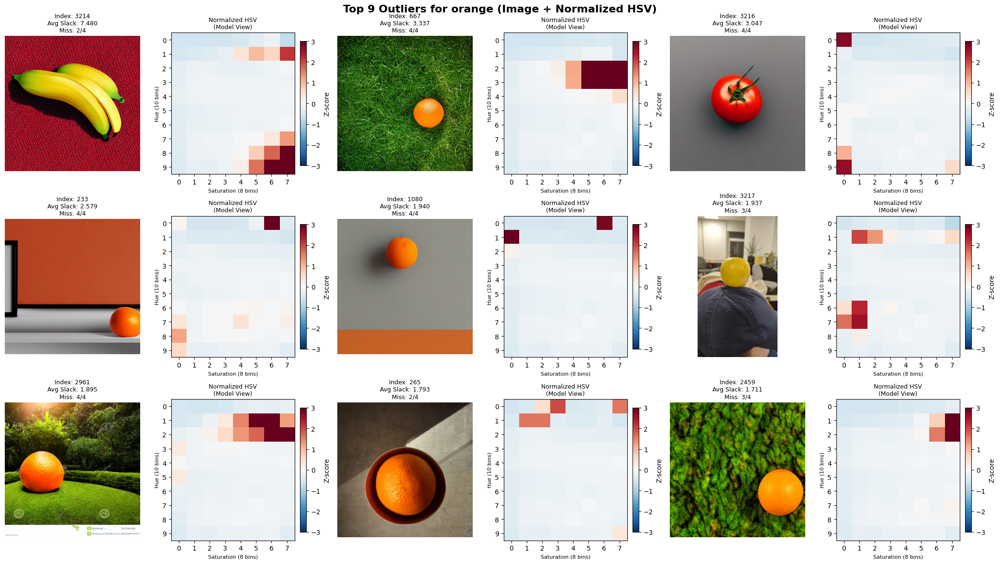

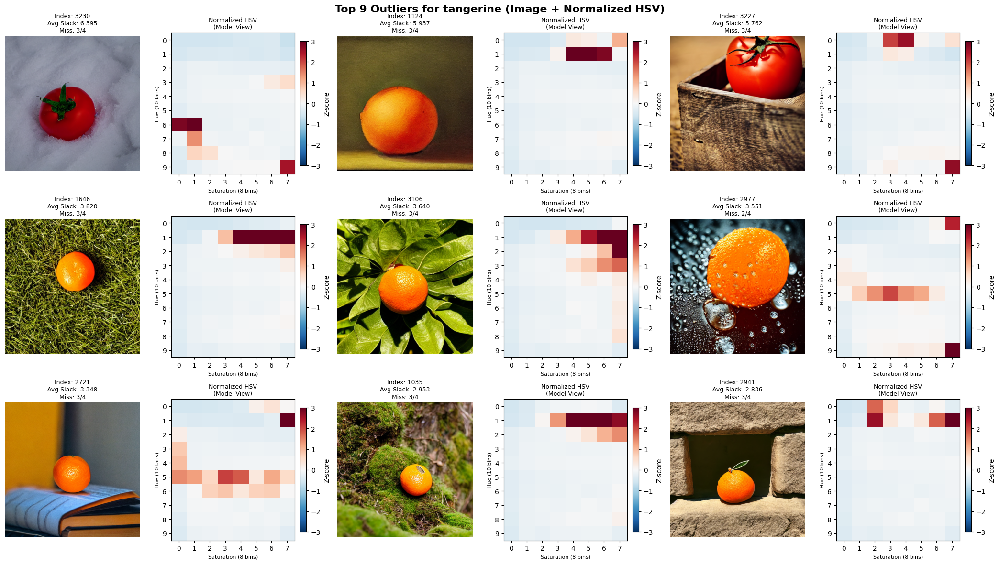

In [10]:
def display_outliers_with_hsv(category, outlier_indices, max_images=9):
    n_images = min(len(outlier_indices), max_images)

    if n_images == 0:
        print(f"No outliers to display for {category}")
        return

    n_cols = 3  # 3 images per row
    n_rows = (n_images + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols * 2, figsize=(7*n_cols, 4*n_rows))
    fig.suptitle(f'Top {n_images} Outliers for {category} (Image + Normalized HSV)',
                 fontsize=16, fontweight='bold')

    if n_rows == 1:
        axes = axes.reshape(1, -1)

    for i, idx in enumerate(outlier_indices[:n_images]):
        row = i // n_cols
        col = (i % n_cols) * 2  # Each image takes 2 columns

        img_path = df.iloc[idx]["Image_path"]

        img = Image.open(img_path)
        img_rgb = np.array(img)
        hist_normalized = X.iloc[idx].values

        stats = all_category_statistics[category][idx]

        # Display original image
        if img_rgb is not None:
            axes[row, col].imshow(img_rgb)
        axes[row, col].axis('off')
        axes[row, col].set_title(
            f'Index: {idx}\n'
            f'Avg Slack: {stats["avg_slack"]:.3f}\n'
            f'Miss: {stats["misclassified_count"]}/{stats["num_classifiers"]}',
            fontsize=9
        )

        # Display normalized HSV histogram as 10x8 heatmap
        hist_2d = hist_normalized.reshape(10, 8)  # 10 Hue bins x 8 Saturation bins

        # Use diverging colormap since normalized values can be negative
        im = axes[row, col + 1].imshow(hist_2d, cmap='RdBu_r', aspect='auto',
                                       vmin=-3, vmax=3)  # Typical z-score range
        axes[row, col + 1].set_xlabel('Saturation (8 bins)', fontsize=8)
        axes[row, col + 1].set_ylabel('Hue (10 bins)', fontsize=8)
        axes[row, col + 1].set_title('Normalized HSV\n(Model View)', fontsize=9)
        axes[row, col + 1].set_xticks(range(8))
        axes[row, col + 1].set_yticks(range(10))

        plt.colorbar(im, ax=axes[row, col + 1], fraction=0.046, pad=0.04, label='Z-score')

    # Hide unused subplots
    total_subplots = n_rows * n_cols * 2
    used_subplots = n_images * 2
    for i in range(used_subplots, total_subplots):
        row = i // (n_cols * 2)
        col = i % (n_cols * 2)
        axes[row, col].axis('off')

    plt.tight_layout()
    plt.show()

# Display outliers with normalized HSV histograms
for category in categories:
    stats = all_category_statistics[category]
    all_avg_slacks = [s['avg_slack'] for s in stats.values()]
    outlier_threshold = np.percentile(all_avg_slacks, 95)
    outliers = [idx for idx, s in stats.items() if s['avg_slack'] > outlier_threshold]

    # Sort by average slack
    outliers_sorted = sorted(outliers,
                            key=lambda idx: stats[idx]['avg_slack'],
                            reverse=True)

    display_outliers_with_hsv(category, outliers_sorted, max_images=9)